<img src="https://raw.githubusercontent.com/chrisvdweth/selene/refs/heads/master/notebooks/images/logo/selene-logo-640.png" style="max-height:75px;" alt="SELENE Logo" />

**Disclaimer:** This Jupyter Notebook contains content generated with the assistance of AI. While every effort has been made to review and validate the outputs, users should independently verify critical information before relying on it. The SELENE notebook repository is constantly evolving. We recommend downloading or pulling the latest version of this notebook from Github.

# Principal Component Analysis (PCA)

In many real-world applications, datasets contain a large number of variables or features. For example, image datasets may contain thousands of pixel values, biological datasets may include measurements for thousands of genes, and financial datasets often track many correlated indicators simultaneously. While high-dimensional data can provide detailed information, it also creates practical challenges. Models trained on such data can become computationally expensive, difficult to interpret, and more sensitive to noise and overfitting. As a result, dimensionality reduction has become an essential step in modern data analysis and machine learning workflows.

**Dimensionality reduction techniques** aim to represent data using fewer variables while preserving as much important information as possible. By reducing the number of dimensions, we can simplify datasets, improve visualization, speed up computations, and sometimes even improve the performance of machine learning algorithms. In particular, reducing redundant or highly correlated features can make patterns in the data easier to identify and interpret.

**Principal Component Analysis (PCA)** is one of the most widely used techniques for dimensionality reduction. PCA is a **linear, unsupervised learning method** that transforms the original variables into a new set of orthogonal variables known as *principal components*. These components are ordered according to the amount of variance they capture from the data, meaning that the first few components often contain most of the useful information present in the original dataset. Because PCA does not require labeled data, it is considered an unsupervised method and is commonly used for exploratory data analysis and preprocessing.

Learning PCA is important for several reasons. First, PCA provides a practical and mathematically elegant way to analyze high-dimensional data. Second, it is frequently used in machine learning pipelines for feature extraction, noise reduction, and data compression. PCA is also a foundational concept that connects ideas from statistics, linear algebra, and optimization, making it valuable for understanding more advanced machine learning methods. By studying PCA, we gain insight into how complex datasets can be represented more compactly while still preserving their essential structure.

In this notebook, we will explore the intuition behind PCA, understand the mathematical principles that motivate it, and apply it to real datasets. We will examine how principal components are computed, how much variance they capture, and how PCA can be used to visualize and simplify high-dimensional data in practice.


### Setting up the Notebook

#### Make Required Imports

This notebook requires the import of different Python packages but also additional Python modules that are part of the repository. If a package is missing, use your preferred package manager (e.g., [conda](https://anaconda.org/anaconda/conda) or [pip](https://pypi.org/project/pip/)) to install it. If the code cell below runs with any errors, all required packages and modules have successfully been imported.

In [1]:
from src.utils.libimports.pca import *
from src.utils.plotting.pca import *
from src.utils.data.files import *

#### Download Required Data

Some code examples in this notebook use data that first need to be downloaded by running the code cell below. If this code cell throws any error, please check the configuration file `config.yaml` if the URL for downloading datasets is up to date and matches the one on Github. If not, simply download or pull the latest version from Github.

In [2]:
demo_data_2d, _ = download_dataset("tabular/resources/pca-demo-data-2d.csv")
demo_data_3d, _ = download_dataset("tabular/resources/pca-demo-data-3d.csv")

File 'data/datasets/tabular/resources/pca-demo-data-2d.csv' already exists (use 'overwrite=True' to overwrite it).
File 'data/datasets/tabular/resources/pca-demo-data-3d.csv' already exists (use 'overwrite=True' to overwrite it).


#### Prepare Data

For all examples in this notebook, we consider two small demo datasets: a $2$-dimensional dataset containing $20$ data points, and a $3$-dimensional dataset containing $200$ data points. Both CSV files simply contain the coordinates of each data point. The code cell below, loads both dataset files into Pandas DataFrames and converts them into NumPy arrays.

In [3]:
df_2d = pd.read_csv(demo_data_2d)
df_3d = pd.read_csv(demo_data_3d)

X_2d = df_2d.to_numpy()
X_3d = df_3d.to_numpy()

print(f"Shape of 2D dataset: {X_2d.shape}")
print(f"Shape of 3D dataset: {X_3d.shape}")

Shape of 2D dataset: (20, 2)
Shape of 3D dataset: (200, 3)


The notebook contains several plots visualizing the data.

#### Preliminaries

* This notebook generates several animated plots that greatly improve the visualization of the inner works of PCA. However, generating these animations is likely to take a couple of seconds. If needed, the animation can be converted to static plots, as explained in the notebook.

---

## Introduction

### Basic Goal

Although PCA is most commonly applied to high-dimensional datasets, developing an intuition for its behavior is much easier in two or three dimensions, where the data and transformations can be directly visualized. Low-dimensional examples allow us to observe how PCA identifies directions of maximum variance, rotates the coordinate system to align with these directions, and can reduce dimensionality while preserving as much information as possible. 

So let's start by looking at our $2$-dimensional demo dataset. We provide the auxiliary method `plot_data_2d()` for that.

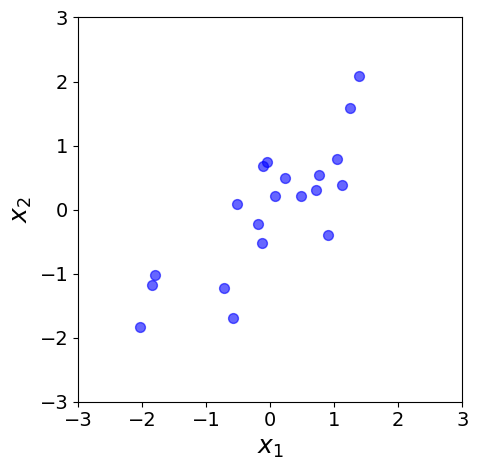

In [4]:
plot_data_2d(X_2d)

Just by looking at the plot we can see that $x_1$ and $x_2$ are quite correlated. This means that they tend to change together in a consistent way. If the correlation is positive, larger values of $x_1$ are usually associated with larger values of $x_2$; if it is negative, larger values of $x_1$ are usually associated with smaller values of $x_2$. A strong correlation indicates a strong relationship between the variables, but it does not necessarily mean that one variable causes the other. We can quantify this by computing the [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient) using the [np.corrcoef()](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) method proved by NumPy.

In [5]:
corr_matrix = np.corrcoef(X_2d[:,0], X_2d[:,1])

print(f"Correlation between x1 and x2: {corr_matrix[0][1]:.2f}")

Correlation between x1 and x2: 0.81


As we could already see in the previous plot, $x_1$ and $x_2$ are positively correlated since larger values of $x$ imply larger values of $y$, and vice versa. In terms of the strength of the correlation, the Pearson correlation coefficient between both variables is $0.81$, indicating a **strong positive correlation** between two variables. 

Now let's assume $x_1$ and $x_2$ are two features for some machine learning task. When two features have a high correlation, they contain much of the same information. This **redundancy** can make it harder to interpret the importance of individual features, especially in models such as linear or logistic regression. The model may have difficulty determining how much weight to assign to each feature, leading to unstable coefficient estimates that can change substantially with small changes in the training data. Highly correlated features can also increase model complexity without adding much predictive value. In some algorithms, this **multicollinearity** can reduce generalization performance, increase training time, or make the model more sensitive to noise. 

**Dimensionality reduction techniques** provide a principled way to address this problem by transforming the original feature set into a smaller number of new features that capture most of the important information. Methods such as Principal Component Analysis (PCA) combine correlated variables into uncorrelated components, reducing redundancy while preserving the dominant patterns in the data. By working with a lower-dimensional representation, models can often be trained more efficiently, become less sensitive to noise, and achieve better generalization on unseen data.

### The Intuition behind PCA

Principal Component Analysis (PCA) is a linear dimensionality reduction method since it creates new features as **linear combinations** of the original features. PCA transforms the data into a new feature space where the most important information is concentrated in a smaller number of derived variables. 

Fundamentally, all linear methods for feature extraction aim to determine some form of transformation matrix that maps the original feature space into a new feature space. The rows or columns of this matrix define how the original features are combined to form the new features. The original feature space is typically our original feature matrix $\mathbf{X}\in \mathbb{R}^{n\times d}$, where $n$ is the number of data samples, and $d$ is the number of features. We know want to transform or project $\mathbf{X}$ into lower-dimensional space represented by a new feature matrix $\mathbf{P}\in\mathbb{R}^{n\times p}$, where $p$ is then number of new features in the projected space. Naturally, we want $p < n$ or typically even $p \ll n$. To this end, we need to a transformation matrix $\mathbf{W}\in\mathbb{R}^{d\times p}$ such that:

$$\large
\mathbf{P} = \mathbf{XW}
$$

In principle, *any* transformation matrix $\mathbf{W}$ with suitable dimensions can map the original feature matrix into a lower-dimensional space. However, most arbitrary transformations would discard important structure or information contained in the data. The overall goal of linear feature extraction is therefore to identify a transformation matrix that reduces dimensionality while preserving as much relevant information as possible. And this is where different approaches for linear methods can be distinguished from each other &mdash; that is, by their use of different criteria to determine the "best" transformation matrix $\mathbf{W}$.

To illustrate this, let's assume we want to reduce our $2$-dimensional dataset down to just $1$ dimension. One naive transformation would be to simply ignore the feature $x_2$ which is analogous to mapping all data points to the $x_1$-axis (left plot). We can perform this transformation using the following matrix $\mathbf{W}\in\mathbb{R}^{d\times 1}$, which is just a vector since the output is $1$-dimensional:

$$\large
\mathbf{W} = 
\begin{bmatrix}
 1 \\
 0 
\end{bmatrix}
$$

We can easily implement this transformation; see the code cell below. However, note that the `W` is a $2\times 2$ matrix because we want to visualize the result in the same $2$-dimensional plot. This also means that the transformed dataset `X_2d_pca` still has two features, but the second feature is $0$ for all data samples. Again, this is just so we can visualize the result nicely.

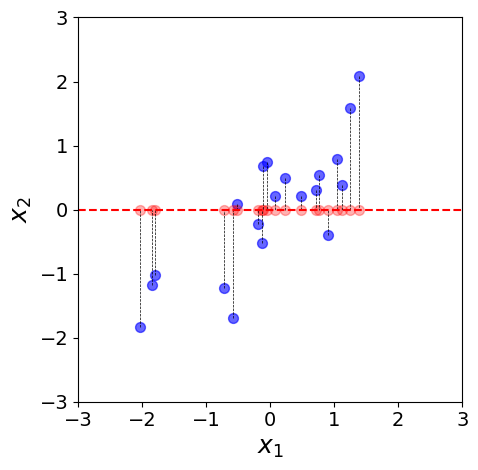

In [6]:
# Define transformation matrix
W = np.array([ [1, 0], [0, 0] ])

# Perform transformation
X_2d_pca = X_2d @ W

# Plot results
plot_data_2d(X_2d, X_pca=X_2d_pca)

Notice how the projected data (red points) is now more bunched together, thus potentially losing useful patterns and information. Keep in mind that any kind of dimensionality reduction techniques yield some kind of **loss of information**. The goal is, of course, to minimize this loss as much as possible.

Let's therefore consider the other naive alternative where we map the data onto the $x_2$-axis by ignoring the feature $x_1$. In this case, the transformation matrix $\mathbf{W}$ looks as follows:

$$\large
\mathbf{W} = 
\begin{bmatrix}
 0 \\
 1 
\end{bmatrix}
$$

As before, we can quickly implement this for our demo dataset to see how well it forms. Again, `W` is a $2\times 2$ matrix here so we can show the projected points in the same plot as the original data, but now the first feature of all data points is $0$.

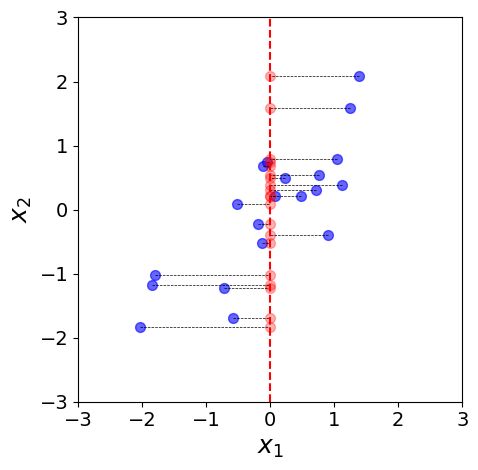

In [7]:
# Define transformation matrix
W = np.array([ [0, 0], [0, 1] ])

# Perform transformation
X_2d_pca = X_2d @ W

# Plot results
plot_data_2d(X_2d, X_pca=X_2d_pca)

This transformation is arguably a bit better since the projected data is a bit more spread out compared to the first transformation attempt. 

Assuming that we want to avoid that the projected data becomes bunched together but remains as spread out as possible, the question is therefore if we can find some transformation matrix to optimize this goal. This is where PCA comes in. To provide the intuition, let's use the [`PCA`](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) implementation of [scikit-learn](https://scikit-learn.org/) to

* Reduce the dimensionality of our demo dataset from $2$ dimensions down to $1$ dimension, *and*
* Perform an inverse transformation; again, this is only to plot the projected data in the $2$-dimensional plot!

Just run the code cell below to perform all steps and show the result plot. Right now you do not have to worry how PCA works; this comes later.

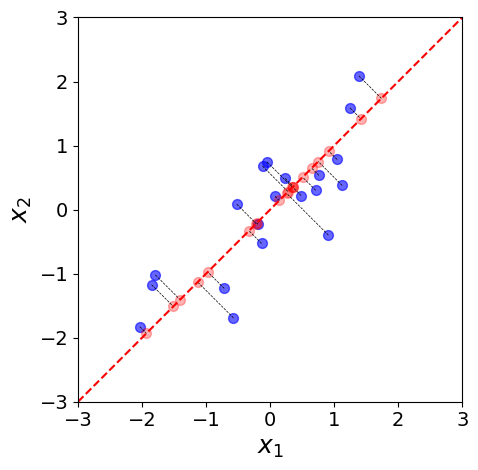

In [8]:
pca = PCA(n_components=1).fit(X_2d)
X_2d_pca = pca.fit_transform(X_2d)
X_2d_pca = pca.inverse_transform(X_2d_pca)

plot_data_2d(X_2d, X_pca=X_2d_pca)

Now all projected points (red) lie on a $1$-dimensional line that preserve the maximum spread. In other words, any other project would cause the data points to become more bunched together after the transformation.

So far, we only looked at our $2$-dimensional dataset since it makes it very easy to visualize the fundamental idea of PCA. However, of course, nothing changes when we go to higher dimensions. Since we still want to plot the data, we are naturally limited to $3$-dimensional data. So let's use this dataset as well. Again, with `plot_data_3d()` we provide an auxiliary method to generate the plots. Note that `azim` (azimuth) controls the horizontal angle ($0-360$) of the plot; if `azim=None` the plot will be animated and rotating around this angle.

In [9]:
plot_data_3d(X_3d, max_lim=4, azim=None, repeat=True)

We can now use PCA to map the dataset from $3$ to $2$ dimensions. Using the inverse transformation provided by [scikit-learn](https://scikit-learn.org/), we can then show the PCA result in the same plot. Of course, now all projected data points will lie on the same plane.

In [10]:
pca = PCA(n_components=2).fit(X_3d)

plot_data_3d(X_3d, pca=pca, show_projection=True, show_mapping=True, max_lim=4, azim=None, repeat=True)

As mentioned before, the actual result of this transformation will be a $2$-dimensional dataset. This means we can actually use the method `plot_data_2d()` to visualize the dataset after its reduction from $3$ to $2$ dimensions. Notice in the plot that we need to rename the axis, here to $x^\prime$ and $x^{\prime\prime}$ since we generated *new* features as some linear combination of the original features.

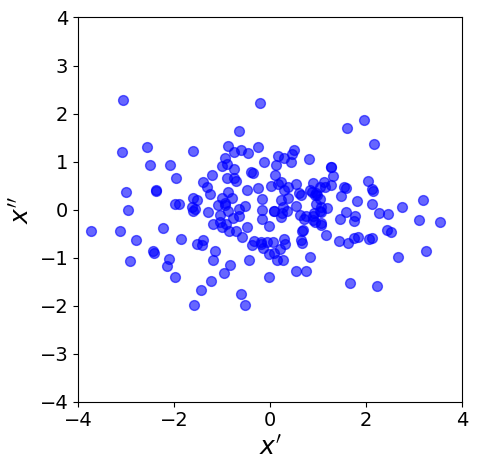

In [11]:
pca = PCA(n_components=2).fit(X_3d)
X_3d_pca = pca.transform(X_3d)

plot_data_2d(X_3d_pca, x_label="$x^\prime$", y_label="$x^{\prime\prime}$", max_lim=4)

Although not easy to see, this plot shows the true PCA result which was described by the red data points lying in the same plane in the $3$-dimensional plot above. Any other transformation from the original $3$ down to $2$ dimension would cause the projected data points to be more bunched up together.

Of course, we can also reduce the dimensionality of the $3$-dimensional dataset down to just $1$-dimension, which means that all data points are projected into a straight line. Again, using an inverse transformation, we can visualize how this straight line looks into the original $3$-dimensional space.

In [12]:
pca = PCA(n_components=1).fit(X_3d)

plot_data_3d(X_3d, pca=pca, show_projection=True, show_mapping=True, max_lim=4, azim=None, repeat=True)

To sum up, the key intuition behind PCA is to find a transformation, represented by a transformation matrix $\mathbf{W}$, such that projected data points are as spread out as possible. A large spread (or variance) indicates that the projection preserves a significant amount of the information and structure present in the original dataset. By projecting the data onto a small number of these high-variance directions, PCA reduces dimensionality while retaining as much of the original information as possible. How exactly PCA is doing is, we will cover next.

**Side note:** An alternative way to formulate Principal Component Analysis (PCA) is through **reconstruction error minimization** rather than **variance maximization**. Instead of seeking a low-dimensional subspace that captures as much variance as possible, we can look for a subspace that minimizes the residuals, i.e., the distances between the original data points and their projections onto that subspace &mdash; represented by the dashed black lines between the blue original points and the red projected points in the plots above. These two optimization objectives are mathematically equivalent. In practice, however, the variance-maximization formulation is much more convenient because it leads directly to an eigenvalue problem involving the covariance matrix. The principal components can then be obtained efficiently as the eigenvectors corresponding to the largest eigenvalues, making the derivation and computation of PCA considerably simpler than working directly with the residual-minimization formulation.

---

## The PCA Algorithm

### Basic Assumptions & Limitations

Overall, PCA makes relatively few strict statistical assumptions compared to many other machine learning methods, but it does rely on certain properties of the data in order to produce meaningful results. Data (strongly) violating these assumptions may PCA cause to perform poorly

* **Numerical features.** Since PCA (and similar linear) methods derive new features as a linear combination of existing features, the most obvious requirement for applying PCA is that all features are numerical. Categorical variables are generally not appropriate inputs unless they are first transformed into meaningful numerical representations. Even then, care is needed because arbitrary numeric encodings can introduce artificial relationships that PCA may incorrectly interpret as meaningful structure.

* **Approximately linear relationships**. PCA identifies directions of maximum variance using linear combinations of features, which may fail to capture important nonlinear structures in the data. For example, data lying on a curved manifold or spiral-shaped structure may not be represented well by PCA, even if lower-dimensional structure exists. In such cases, *nonlinear dimensionality reduction* methods such as t-SNE, UMAP, kernel PCA, or autoencoders may be more appropriate.

* **(Relatively) smooth distributions**. Although PCA does *not* strictly require the data to follow a normal (Gaussian) distribution, it tends to work best when the data distribution is reasonably smooth and when variance is a meaningful measure of information. Highly skewed distributions, heavy outliers, or sparse count data can negatively affect PCA because the principal components are sensitive to extreme values. In practice, transformations such as logarithms or robust scaling are often applied before PCA to reduce these effects.

### Data Preprocessing Steps

For PCA, we typically assume a data matrix $\mathbf{X} \in \mathbb{R}^{n \times d}$ consisting of $n$ samples and $d$ numerical features. PCA is most effective when the variables exhibit approximately linear relationships and when the data distribution is reasonably smooth without extreme outliers. Before applying PCA, two important preprocessing steps are usually performed. First, the data must be **mean centered**, meaning that the mean of each feature is subtracted so that every feature has zero mean. This step is required because PCA identifies directions of maximum variance relative to the data center. Second, features are often **scaled** to have comparable magnitudes, typically by dividing by their standard deviations. Feature scaling is not strictly required, but it is commonly applied when variables are measured in different units or have very different ranges, since PCA is highly sensitive to feature variances.

#### Mean-Centering

Mean-centering a data matrix means subtracting the average value of each feature from all observations of that feature. Give our data matrix $X \in \mathbb{R}^{n \times d}$ is the data matrix, for each feature (column) $j$, we compute its mean $\mu_j$ and replace every entry $x_{ij}$ by $x_{ij} - \mu_j$. After this transformation, each feature has mean zero. Using NumPy, we can easily compute the mean for each feature (column) using the built-in method [`np.mean()`](https://numpy.org/doc/stable/reference/generated/numpy.mean.html). We can then use [broadcasting] to subtract the result vector of all $d$ means from the data matrix $\mathbf{X}$ (i.e., replace every entry $x_{ij}$ by $x_{ij} - \mu_j$). This can be written in a single line of code:

In [13]:
X_2d_centered = X_2d - np.mean(X_2d, axis=0)
X_3d_centered = X_3d - np.mean(X_3d, axis=0)

To see the result, we can plot the mean-centered data using the auxiliary method `plot_data()` again; see below. Notice how the data is not centered around the origin $(0, 0)$.

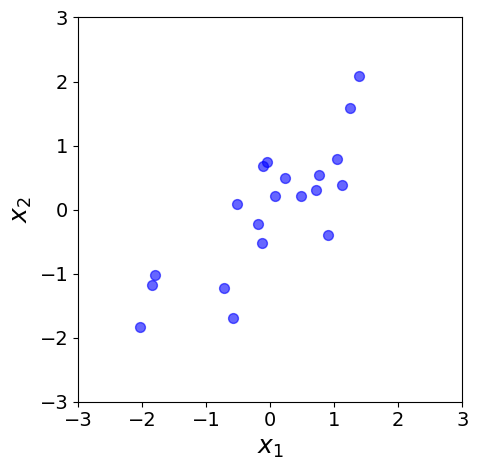

In [14]:
plot_data_2d(X_2d_centered)

The mean-centering of the is a **mandatory** step, either implicitly or explicitly. As we will later see, PCA finds the directions of the maximum variance by finding finding the eigenvectors and eigenvalues of the **covariance matrix** of the data. If we use $C(\mathbf{X})$ to denote the covariance matrix for a data matrix $\mathbf{X}$, then $C(\mathbf{X})$ will have the following structure.

$$\large
\mathbf{C} = \begin{bmatrix}
\text{Var}(X_1) & \text{Cov}(X_1, X_2) & \dots & \text{Cov}(X_1, X_d) \\
\text{Cov}(X_2, X_1) & \text{Var}(X_2) & \dots & \text{Cov}(X_2, X_d) \\
\vdots & \vdots & \ddots & \vdots \\
\text{Cov}(X_d, X_1) & \text{Cov}(X_d, X_2) & \dots & \text{Var}(X_d)
\end{bmatrix}$$

with

$$\large
\text{Var}(X,X) = \frac{1}{n-1} \sum_{i=1}^{n} (x_i - \bar{x})^2
$$

and

$$\large
\text{Cov}(X,Y) = \frac{1}{n-1} \sum_{i=1}^{n} (x_i - \bar{x})(y_i - \bar{y})
$$

where $\bar{x}$ and $\bar{y}$ are the means for features $X$ and feature $Y$, respectively. This means, if we would explicitly compute the covariance matrix $\mathbf{C}$, we would not need to "manually" mean-center the data since this is done as part of computing the variances $Var(X,X)$ and covariances $Cov(X,Y)$.

Although PCA is theoretically defined through the covariance matrix, in practice we usually do not compute the covariance matrix explicitly. Instead, modern PCA implementations typically operate directly on the data matrix using methods &mdash; we discuss this in more detail at the end. This approach is computationally more efficient and numerically more stable, especially for large datasets with many features. However, when working directly with the data matrix, the covariance computation no longer automatically subtracts the feature means. As a result, we must manually mean-center the data beforehand to ensure that PCA analyzes variation around the data center rather than being influenced by the overall feature offsets. 

Without explicit centering, the first principal component may incorrectly align with the mean of the data instead of capturing the true directions of maximal variance. This is because the eigenvectors we need to find go through the origin $(0, 0, ..., 0)$. If the data is not mean-centered but, say,  clustered around $(100, 100, ..., 100)$, the PCA eigenvectors will be forced to point from the origin directly toward the center of that distant data cloud &mdash; and not in the direction of the maximum variance.

#### Feature Scaling

Feature scaling is typically performed before PCA because PCA is based on variances and covariances, making it highly sensitive to the numerical scale of the features. Features with larger ranges or units naturally exhibit larger variances and can therefore dominate the principal components, even if they are not more informative. For example, if one feature ranges from $0$ to $1$ while another ranges from $0$ to $10,000$, the larger-scale feature will strongly influence the results. By scaling the features, typically to unit variance, we ensure that each feature contributes more equally to the PCA computation and that the resulting principal components reflect meaningful patterns in the data rather than differences in measurement scale. Therefore, it is common practice to standardize features before applying PCA, especially when variables are measured in different units.

Again, we can implement this step very easily using NumPy. The expression [`np.std(X_mean_centered, 0)`](https://numpy.org/doc/stable/reference/generated/numpy.std.html) calculates the standard deviation of each column (feature), producing a one-dimensional array of length equal to the number of features. NumPy then uses broadcasting to automatically divide every row of `X_mean_centered` by the corresponding feature standard deviation. This scales the features so that each has approximately unit variance.

In [15]:
X_2d_scaled = X_2d_centered / np.std(X_2d_centered, 0)
X_3d_scaled = X_3d_centered / np.std(X_3d_centered, 0)

Let's also plot the final scaled data matrix.

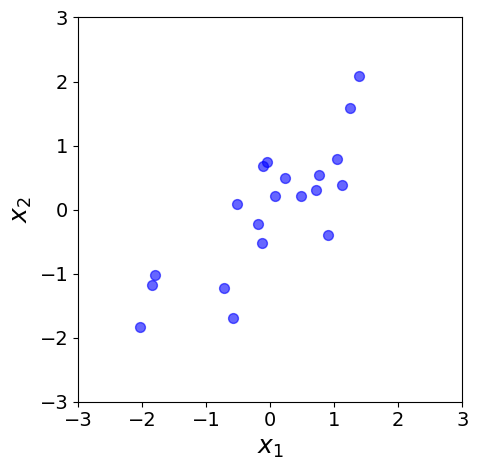

In [16]:
plot_data_2d(X_2d_scaled)

For our basic implementation of PCA later, we can also define a method `normalize()` that combines both steps of mean-centering and scaling.

In [17]:
def normalize(X):
    # Center data around the mean
    X -= np.mean(X, 0)
    # Normlize w.r.t. to standard variance
    X /= np.std(X, 0)
    return X

Thus, preparing our data matrix $\mathbf{X}$ to serve as valid input for PCA, we can simply call this method on `X`:

In [18]:
X_2d_norm = normalize(X_2d)
X_3d_norm = normalize(X_3d)

A nice side effect of work with a mean-centered data matrix $\mathbf{X}$ is the computation of its covariance matrix. In the general case, covariance calculations require explicitly accounting for the column means, but after centering, the sample covariance matrix can be computed directly as $\frac{1}{n-1}X^\top X$. This eliminates the need for separate mean-correction terms, resulting in a more compact expression and more efficient matrix-based computations. Implementing this computation can be done using a single line in Python and using NumPy; see the implementation of the `covariance(X)` method below.

In [19]:
def covariance(X):
    return np.dot(X.T, X) / (X.shape[0] - 1)

Since we need the in a bit, let's compute the covariance matrices for our 2 datasets here.

In [20]:
C_2d = covariance(X_2d)
C_3d = covariance(X_3d)

**Important:** Note that practical implementations of PCA typically do not form the full covariance matrix as it can be computationally expensive and memory-intensive, particularly when the number of features is large. Instead, modern PCA algorithms typically operate directly on the data matrix using methods such as the singular value decomposition (SVD), which are numerically more stable and avoid the need to construct the covariance matrix altogether. Nevertheless, the covariance-based formulation remains extremely valuable from a pedagogical perspective. It provides a clear interpretation of PCA as the search for directions of maximum variance in the data and reveals the direct relationship between principal components and the eigenvectors of the covariance matrix. Although this approach is not the most efficient in practice, it offers important insight into the mathematical foundations of PCA and helps build intuition for why the algorithm works.

### Finding the 1st Principal Component

PCA is best explained as an iterative process of finding one principal component at a time because this builds intuition about the optimization problem that PCA solves. Recall that the first principal component in PCA is the direction in feature space along which the data exhibits the greatest variance. This sequential viewpoint helps explain why the components are ordered by importance and why they must be mutually orthogonal. In practice, however, we do not compute the components one by one. Instead, the eigenvectors of the covariance matrix provide all principal component directions simultaneously, already sorted by their explained variance. Thus, the iterative description is mainly a conceptual and pedagogical tool rather than a reflection of how PCA is typically implemented computationally.

As the name suggests, the 1st principal component in PCA is the direction in feature space along which the data exhibits the greatest variance; let's denote it by $\mathbf{w}_1$. Intuitively, $\mathbf{w}_1$ is the vector that transforms our data matrix $\mathbf{X}$ into a $1$-dimensional projected such that the projected points exhibit the maximum spread, expressed by the projected data's variance. Now that we know what we are looking for, we only "need" to formalize and solve this objective.

To this end, let's further denote $p_i$ as the data point after transformation of $\mathbf{x}_i$ using the vector $\mathbf{w}_1$. Note that each $p_i$ is a scalar value since the map our dataset into a $1$-dimensional space. To compute the variance of the data after the transformation, we also need the mean $\hat{\mu}$ of the data after the transformation. However, since our data matrix is mean-centered with $\mu_j = 0$ for all features, we know that the mean of the transformed data is also zero, i.e., $\hat{\mu} = 0$. Thus, we can find out 1st principal component $\mathbf{q}_1$ as:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\sum_{i=1}^{n}(p_i - \hat{\mu})^2\\[0.5em]
&\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\sum_{i=1}^{n}(p_i)^2\\[0.5em]
&\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\sum_{i=1}^{n}(\mathbf{x}_i\cdot\mathbf{w})^2
\end{align}
$$

The first thing we can do is to get rid of the explicit sum and rewrite the expression using matrix notations:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\lVert\mathbf{Xw} \rVert^2
\end{align}
$$

Using the vector identity $\lVert \mathbf{a}\rVert^2 = \mathbf{a}^\top \mathbf{a} $, we get:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\left(\mathbf{Xw}\right)^\top\left(\mathbf{Xw}\right)
\end{align}
$$

We can further use the matrix equivalence $\left(\mathbf{AB}\right)^\top = \mathbf{B}^\top \mathbf{A}^\top$, giving us:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\mathbf{w}}{\mathrm{argmax}}\frac{1}{n}\mathbf{w}^\top\mathbf{X}^\top\mathbf{X}\mathbf{w}
\end{align}
$$

If we now look closely and move the factor $1/n$ a bit around, we see that the expression now contains the covariance matrix $\mathbf{C}$ &mdash; note that it does not matter if the scaling factor is $1/n$ or $1/(n-1)$ since we only care about the direction of $\mathbf{w}$ which is not affected by that scaling factor:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\mathbf{w}}{\mathrm{argmax}}\ \mathbf{w}^\top\frac{\mathbf{X}^\top\mathbf{X}}{n}\mathbf{w}\\[0.5em]
&\large= \underset{\mathbf{w}}{\mathrm{argmax}}\ \mathbf{w}^\top \mathbf{C}\mathbf{w}
\end{align}
$$

We still have to address one issue: This optimization problem is currently ill-defined since we can just increase vector $\mathbf{w}$ as much as we want. However, since we only care about the direction of $\mathbf{w}$ but not its length, we can and have to constraint the length of $\mathbf{w}$. While, in principle, we can constraint $\mathbf{w}$ to any arbitrary fixed length, in practice, it is convenient to set it as the unit length $\lVert \mathbf{w} \rVert_2 = 1$. Adding this constraint to our optimization problem gives us:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\lVert\mathbf{w}\rVert_2 = 1}{\mathrm{argmax}}\ \mathbf{w}^\top \mathbf{C}\mathbf{w}
\end{align}
$$

Since $\lVert \mathbf{w} \rVert_2 = w_1^2 + w_2^2 + \dots + w_d^2 = 1$, by definition, we also know that $\mathbf{w}^\top\mathbf{w} = 1$. This means, we can write our expression as:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\lVert\mathbf{w}\rVert_2 = 1}{\mathrm{argmax}}\ \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}
\end{align}
$$

Now, for any matrix $\mathbf{C}$, the expression $\large \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}$ is called the [**Rayleigh quotient**](https://en.wikipedia.org/wiki/Rayleigh_quotient). Without going into too much detail here, The Rayleigh quotient is a scalar quantity that measures how strongly a vector aligns with the action of a matrix. For a symmetric matrix $\mathbf{C}$ (and the covariance matrix is symmetric!) and a nonzero vector $w$ (and we know that $\lVert\mathbf{w}\rVert_2 = 1$), the maximum value of the Rayleigh quotient is the **largest eigenvalue** of $\mathbf{C}$, achieved when $\mathbf{w}$ is the corresponding **eigenvector**. In short, we find the 1st principal component $\mathbf{w}_1$ as the eigenvector of the covariance matrix $\mathbf{C}$ with the largest eigenvalue. For the time being, let's assume we have the means to compute the eigenvector with the largest eigenvalue.

If we would stop here &mdash; that is, $\mathbf{w}_1$ forms the final transformation matrix $\mathbf{W}\in\mathbb{R}^{d\times 1}$ (since $p=1$) &mdash; we would maximize the variance of the data in the projected space, but we would always project into the $1$-dimensional space. While this may be enough for our $2$-dimensional demo dataset, in practice, we often deal with high-dimensional datasets we want to reduce to lower dimensional space, but with more than $1$ dimension. Later, we discuss how to determine meaningful values for $p$ (i.e., the number of dimensions in the target space).

With that knowledge, we can implement a method `first_principal_component()`, that finds the 1st principal component of a covariance matrix. Since our focus is not on computing eigenvectors, we use built-in methods provided by NumPy for this. Note that this naive implementation finds *all* eigenvectors of a matrix but only returns the one with the largest eigenvalue. Since we only need the dominant eigenvalue, it is unnecessary to solve the entire eigendecomposition problem, and there are more efficient solutions out there to find the dominant eigenvector. However, such methods are beyond our scope here, and more importantly, we will later see that practical implementations do perform eigendecomposition to perform PCA.

In [21]:
def first_principal_component(C):
    eigenvals, eigenvecs = np.linalg.eigh(C)
    key = np.argsort(eigenvals)[::-1][:1]
    return eigenvals[key], eigenvecs[:, key]

The method returns the eigenvalue as well as the eigenvector of the 1st principal component, but we only need the latter. Let's apply it to our $2$-dimensional and $3$-dimensional dataset to compute their respective 1st principal components.

In [22]:
_, pc_2d_pc1 = first_principal_component(C_2d)
_, pc_3d_pc1 = first_principal_component(C_3d)

We first plot the returned vector together with the original data points for the $2$-dimensional dataset.

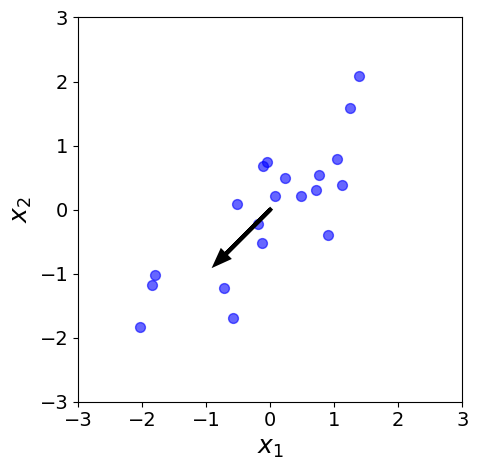

In [23]:
plot_data_2d(X_2d, pcs=pc_2d_pc1)

Just by eyeballing the plot you can easily convince yourself that the arrow (i.e., the eigenvector representing the 1st principal component) points into the direction with the maximum variance. By the way, the eigenvector could also point into the exact opposite direction; it would change the result we are looking for.

We can do the same for our $3$-dimensional dataset. However, notice that we are not explicitly calling the method `first_principal_component()` here but use, in fact, the PCA implementation of [scikit-learn](https://scikit-learn.org/) and pass it to the method `plot_data_3d()`. The only reason for this is to make the plotting of the $3$-dimensional more flexible. Under the hood, the same steps are performed to find the 1st principle component.

In [24]:
pca = PCA(n_components=1).fit(X_3d)

plot_data_3d(X_3d, pca=pca, show_pcs=1, pcs_scaling=2, max_lim=4, azim=None, repeat=True)

Overall, the result is the same as for the $2$-dimensional: we found the 1st principle component as the vector pointing in the direction of the maximum variance of the dataset. And in some sense, this is the core process of PCA, and everything else builds on this.

As a little "teaser" for that, in case of the $3$-dimensional dataset, we can also compute an plot the 1st and 2nd principal component &mdash; the vector pointing into the direction of the maximum variance (same as before), and the vector pointing into the direction of the maximum variance but *ignoring* the first direction. Note that this visualizing takes the eigenvalues into account when computing the length of the arrows in the plot.

In [25]:
pca = PCA(n_components=2).fit(X_3d)

plot_data_3d(X_3d, pca=pca, show_pcs=2, pcs_scaling=2, max_lim=4, azim=None, repeat=True)

As the plot indicates, and we will see in a bit, all principal components are orthogonal vectors.

### Finding the 2nd, 3rd, ... Principal Components

Now that we have found the first principal component $\mathbf{w}_1$, the goal is to find the next direction of maximum variance, $\mathbf{w}_2$ &mdash; and then so on until $\mathbf{w}_p$. In a basic sense, the core steps mimic the ones we just did to find the 1st principal component. However, when finding $\mathbf{w}_2$ we need to ensure we are capturing new information. In other words, we need to ignore all information about the variance in the data we have already captured by $\mathbf{w}_1$. In a nutshell, we must enforce a strict geometric constraint: the subsequent components must be completely uncorrelated with (orthogonal to) the components already found. This can be done using three basic approaches, **matrix deflation** and **eigendecomposition**, and **singular value decomposition**, which we both briefly cover.

#### Approach 1: Matrix Deflation

Matrix deflation is a technique used in PCA to sequentially extract multiple principal components. After the first principal component has been identified, its contribution is removed from the data matrix, producing a residual matrix that contains only the remaining variation. PCA is then applied again to this residual matrix to find the next principal component. Intuitively, deflation prevents subsequent components from rediscovering variance that has already been explained, ensuring that each new component captures a distinct and orthogonal source of variation in the data.

Mathematically, for a mean-centered data matrix $\mathbf{X}$, matrix deflation involves the following steps:

* Project of the data onto the first component is $\mathbf{X}\mathbf{w}_1$.
* Reconstruct of the data using *only* this component is $(\mathbf{X}\mathbf{w}_1)\mathbf{w}_1^T$.
* subtract this reconstruction from our original data to get a residual matrix, $\mathbf{X}_{\text{new}}$

In summary:

$$\large
\mathbf{X}_{\text{new}} = \mathbf{X} - \mathbf{X}\mathbf{w}_1\mathbf{w}_1^T
$$

Now, $\mathbf{X}_{\text{new}}$ contains only the remaining variance. We can run the exact same optimization algorithm finding the 1st principal component as before on $X_{\text{new}}$ to find its direction of maximum variance, which becomes $\mathbf{w}_2$. This process of deflating the matrix based on the most recent component and finding the 1st principal component on the resulting residual matrix continues until we have found all $p$ components.

Geometrically, matrix deflation of a $3$-dimensional point cloud collapses the data along its most dominant axis of variance, perfectly flattening the entire 3D shape into a 2D shadow. Given our $3$-dimensional example dataset, deflation takes every individual data point and slides it parallel to that longest axis until it lands on a flat $2$-dimensional plane passing through the origin, oriented exactly perpendicular to $\mathbf{w}_1$. While the resulting data coordinates are still technically stored in a $3$-dimensional format, the cloud now has zero thickness or variance along that first axis, effectively locking the data onto a $2$-dimensional plane. 

To visualize this, we used the PCA implementation of [scitkit-learn](https://scikit-learn.org/) to compute the 1st principal component of our $3$-dimensional data matrix `X_3d`. With the help of NumPy to compute `X_new` based on the expression $\mathbf{X}_{\text{new}} = \mathbf{X} - \mathbf{X}\mathbf{w}_1\mathbf{w}_1^T$.

In [26]:
def deflate_matrix(X, pc):
    return X - np.outer(X @ pc, pc)

Let's deflate the data matrices $\mathbf{X}$ for our $2$-dimensional and $3$-dimensional datasets with respect to each dataset's 1st principle component we found earlier.

In [27]:
X_2d_new = deflate_matrix(X_2d, pc_2d_pc1)
X_3d_new = deflate_matrix(X_3d, pc_3d_pc1)

We first plot the deflated matrix of the $2$-dimensional dataset &mdash; which is still $2$-dimensional! &mdash; together with the 1st principal component to see their relationship.

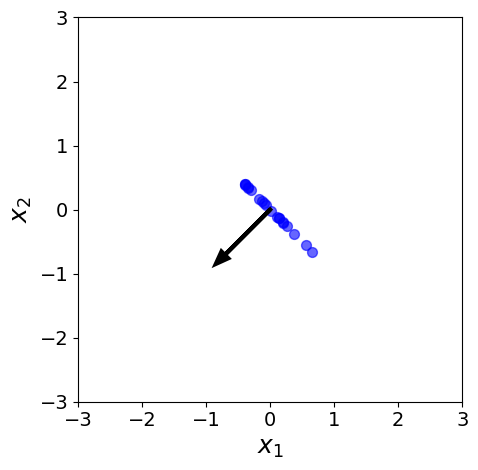

In [28]:
plot_data_2d(X_2d_new, pcs=pc_2d_pc1)

As described above, matrix deflation transforms all data points by projecting onto a line perpendicular to the 1st principal component. The code cell below plots the same result for our $3$-dimensional dataset.

In [29]:
pca = PCA(n_components=1).fit(X_3d)

plot_data_3d(X_3d_new, pca=pca, show_pcs=1, pcs_scaling=1.0, azim=None, repeat=True)

In the $3$-dimensional case, all data points are now projected onto the same plane, with now the plane being perpendicular to the 1st principal component.

After matrix deflation, the contribution of the first principal component has been removed from the data, leaving a residual data matrix $\mathbf{X}_{\text{new}}$ that contains only the variation *not* explained by the first component. Since $\mathbf{X}_{\text{new}}$ can be treated as a new mean-centered data matrix, we can repeat the PCA procedure by computing its covariance matrix and finding its dominant eigenvector. The eigenvector corresponding to the largest eigenvalue of this covariance matrix identifies the direction of greatest remaining variance in the residual data. Importantly, this dominant eigenvector of the covariance matrix of $\mathbf{X}_{\text{new}}$ is precisely the second principal component of the original dataset. 

By repeatedly applying deflation and recomputing the leading eigenvector of the updated covariance matrix, the principal components can be extracted one at a time. Each newly discovered component $\mathbf{w}_i$ is orthogonal to the previously extracted components and explains the largest amount of variance that remains in the data. This gives us our final transformation matrix $\mathbf{W}$ as the matrix containing all principal components. Thus, if $p$ is the number of target dimensions, we get:


$$\mathbf{W} = \begin{bmatrix} \mathbf{w}_1 & \mathbf{w}_2 & \dots & \mathbf{w}_p \end{bmatrix}$$


The method `pca_matrix_deflation()` implements this approach of iteratively finding the 1st principal component of the covariance matrix and deflating the data matrix accordingly &mdash; note the loop as the main part of the method. Variable `W` collects all principal components to form the transformation matrix $\mathbf{W}$; we also keep track of and return all corresponding eigenvalues, although this is not needed here. Lastly, the method performs the transformation operation $\mathbf{P} = \mathbf{XW}$ and returns all results.

In [30]:
def pca_matrix_deflation(X, n_components=1):
    W, V = [], []
    # Create a copy of the input data matrix
    X_ = X.copy()
    # Mean-center and stadardize data matrix
    X_ = normalize(X_)
    # Iteratively find 1st PC and deflate matrix
    for _ in range(n_components):
        # Create covariance matrix
        C = covariance(X_)
        # Find 1st principal component
        pc_val, pc_vec = first_principal_component(C)
        W.append(pc_vec.squeeze())
        V.append(pc_val)
        # Deflate matrix
        X_ = deflate_matrix(X_, pc_vec)
    # Convert transformation matrix and vector with eigenvalues to NumPy arrays
    W = np.asarray(W).T
    V = np.asarray(V)
    # Compute final projection into lower-dimensional space
    P = X @ W
    return P, W, V

To show the application of method `pca_matrix_deflation()`, we can apply to reduce our $3$-dimensional dataset to $2$ dimensions. We can then use the auxiliary method `plot_data_2d()` to plot the project data which is, of course, now $2$-dimensional. As before, we need to rename the axis since we generated *new* features as some linear combination of the original features.

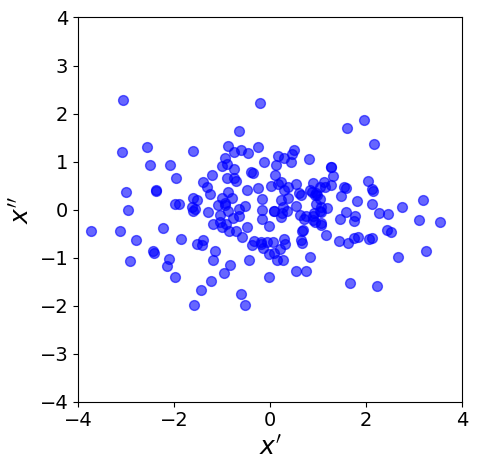

In [31]:
P, W, V = pca_matrix_deflation(X_3d, n_components=2)

plot_data_2d(P, x_label="$x^\prime$", y_label="$x^{\prime\prime}$", max_lim=4)

Of course, this plot matches the one we already saw as part of the motivation &mdash; after all, we performed the exact same steps, only that now we know how it is done.

**Important:** Although matrix deflation provides an intuitive way to derive PCA and sequentially extract principal components, it is not the approach most commonly used in modern PCA implementations. Repeatedly computing covariance matrices, finding their dominant eigenvectors, and performing deflation can be computationally expensive and may accumulate numerical errors over successive iterations. As a result, practical software libraries typically compute all principal components simultaneously; discussed next. Nevertheless, matrix deflation remains an important conceptual tool for understanding PCA. It clearly illustrates how each principal component captures the largest remaining variance after the previously identified components have been removed. This sequential viewpoint provides valuable geometric intuition and helps explain why the principal components are orthogonal and ordered according to the amount of variance they explain.

#### Approach 2: Eigendecomposition

When using matrix deflation, we ensured that we ignore all information about the variance in the data already captured by $\mathbf{w}_1$ by explicitly removing its contribution by deflating $\mathbf{X}$ to find $\mathbf{w}_2$, and so on. An alternative way to ignore all information captured by $\mathbf{w}_1$ when finding $\mathbf{w}_2$ is to ensure that $\mathbf{w}_2$ must be orthogonal to $\mathbf{w}_1$, i.e., $\mathbf{w}_2^\top\mathbf{w}_1=0$. Express this by adding this additional constraint to the definition of a principal component:

$$
\begin{align}
\large\mathbf{w_2}\ &\large= \underset{\lVert\mathbf{w}\rVert_2 = 1,\ \mathbf{w}^\top\mathbf{w}_1=0}{\mathrm{argmax}}\ \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}
\end{align}
$$

In simple terms, we still want to find the direction with the largest variance but this direction must be orthogonal to $\mathbf{w}_1$. We can also generalize this, defining that the $k$-th principal component is obtained from:

$$
\begin{align}
\large\mathbf{w_k}\ &\large= \underset{\lVert\mathbf{w}\rVert_2 = 1,\ \mathbf{w}^\top\mathbf{w}_j=0\ \forall j<k}{\mathrm{argmax}}\ \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}
\end{align}
$$

Now, the important and mathematically very convenient observation is that out covariance matrix $\mathbf{C}$ is symmetric, since covariance between feature $X_i$ and feature $X_j$ is the same as the covariance between feature $X_j$ and feature $X_i$. A fundamental result from linear algebra states that the eigenvectors of a real symmetric matrix corresponding to distinct eigenvalues are orthogonal. This property guarantees that the principal components are mutually orthogonal and therefore capture distinct, non-overlapping sources of variation in the data. In other words, we can simply compute all eigenvectors (incl. their eigenvalues) of covariance matrix $\mathbf{C}$, and find the $p$ eigenvectors with the largest eigenvectors to form the transformation matrix $\mathbf{W}$; no iterations required!

The method `pca_eigendecomposition()` in the code cell below implements this approach. Keep in mind, however, that this method looks only very simple since the heavy lifting of computing all eigenvectors and eigenvalues is done using NumPy. All the remaining steps are then trivial.

In [32]:
def pca_eigendecomposition(X, n_components=1):
    # Mean-center and standardize data amtrix
    X = normalize(X)
    # Compute covariance matrix
    C = covariance(X)
    # Compute all eigenvalues and eigenvectors
    eigenvals, eigenvecs = np.linalg.eigh(C)
    # Sort the eigenvalues in descending order and return the index of the top-p ones
    idx = np.argsort(eigenvals)[::-1][:n_components]
    # Extract only the top eigenvalues and eigenvectors (i.e., tranformation matrix W)
    V, W = eigenvals[idx], eigenvecs[:, idx]
    P = np.dot(X, W)  # used to be dot(V.T, data.T).T
    return P, W, V

Like before, we can use the `pca_eigendecomposition()` to reduce our $3$-dimensional dataset to $2$-dimensions and plot the results. Unsurprisingly, the results match the one from before when using the matrix deflation approach.

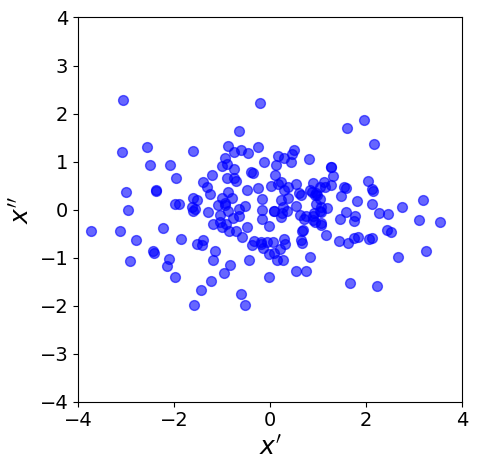

In [33]:
P, W, V = pca_eigendecomposition(X_3d, n_components=2)

plot_data_2d(P, x_label="$x^\prime$", y_label="$x^{\prime\prime}$", max_lim=4)

**Important:** Although looking very straightforward, this eigendecomposition approach has practical limitations for large datasets. The covariance matrix $\mathbf{X}$ has size $d \times d$, where $d$ is the number of features. When the number of features is large, explicitly constructing the covariance matrix can require substantial memory and computational resources. In addition, forming the covariance matrix involves multiplying $\mathbf{X}^\top\mathbf{X}$, which may introduce numerical inaccuracies and can be inefficient when working with high-dimensional data. For these reasons, modern PCA implementations typically avoid computing the covariance matrix altogether &mdash; as we will cover next.

#### Approach 3: Singular Value Decomposition

Singular Value Decomposition (SVD) is a fundamental matrix factorization technique that decomposes any matrix $\mathbf{X} \in \mathbb{R}^{n \times d}$ into the product of three matrices:

$$\large
\mathbf{X} = \mathbf{U}\mathbf{\Sigma}\mathbf{V}^\top
$$

where $\mathbf{U}$ and $\mathbf{V}$ are orthogonal matrices and $\mathbf{\Sigma}$ is a diagonal matrix containing the singular values. The columns of $\mathbf{U}$ represent orthogonal directions in the sample space, the columns of $\mathbf{V}$ represent orthogonal directions in the feature space, and the singular values quantify the importance of these directions. SVD can be applied to any matrix, regardless of whether it is square, symmetric, or invertible. In the context of PCA, SVD provides an efficient way to identify the principal component directions without explicitly computing the covariance matrix. The connection between SVD and PCA comes from a fundamental relationship between the data matrix $\mathbf{X}$ and its covariance matrix. 

To see how this works, let's consider the SVD of $\mathbf{X}^\top$, which is:

$$\large
\mathbf{X}^\top = \left(\mathbf{U}\mathbf{\Sigma}\mathbf{V}^T\right)^\top
$$

The transpose of a product of three matrices is equal to the product of their individual transposes taken in the reverse order. Mathematically, for any three matrices $A$, $B$, and $C$ (assuming their dimensions allow them to be multiplied), the rule is $\left(\mathbf{ABC}\right)^\top = \mathbf{C}^\top\mathbf{B}^\top\mathbf{A}^\top$. Together with the basic rules that $\left(\mathbf{A^\top}\right)^\top = \mathbf{A}$, we can write:

$$
\begin{align}
\large \mathbf{X}^\top\ &\large = \left(\mathbf{U}\mathbf{\Sigma}\mathbf{V}^T\right)^\top\\[0.5em]
&\large = \left(\mathbf{V}^\top\right)^\top\mathbf{\Sigma}^\top\mathbf{U}^\top\\[0.5em]
&\large = \mathbf{V}\mathbf{\Sigma}^\top\mathbf{U}^\top\\[0.5em]
\end{align}
$$

We can now compute $\mathbf{X}^\top\mathbf{X}$ which, apart from the normalization factor $1/(n-1)$, connects us to the covariance matrix $\mathbf{C}$ &mdash; notice this again assumes that our data matrix $\mathbf{X}$ is mean-centered!

$$\large
\mathbf{X}^\top\mathbf{X} = \left(\mathbf{V}\mathbf{\Sigma}^\top\mathbf{U}^\top\right)\left(\mathbf{U}\mathbf{\Sigma}\mathbf{V}^\top\right)
$$

We can simplify this expression using the information that matrix $\mathbf{U}$, meaning that the product between the matrix and its transpose is the identity matrix $\mathbf{I}$, i.e.,  $\mathbf{U}^\top\mathbf{U} = \mathbf{I}$. This, we get:

$$\large
\mathbf{X}^\top\mathbf{X} = \mathbf{V}\mathbf{\Sigma}^\top\mathbf{\Sigma}\mathbf{V}^\top
$$

$\mathbf{\Sigma}$  is a diagonal matrix containing the singular values of $\mathbf{X}$. If $\mathbf{X}$ has shape $n \times d$, then $\mathbf{\Sigma}$ also has shape $n \times d$ and takes the form:

$$\large
\mathbf{\Sigma} = 
\begin{bmatrix} 
\sigma_1 & 0 & \dots & 0 \\
0 & \sigma_2 & \dots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
0 & 0 & \dots & \sigma_d \\
0 & 0 & \dots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
0 & 0 & \dots & 0 
\end{bmatrix}$$

where the main block on top is a $d \times d$ diagonal matrix containing the singular values $\sigma_i$, and the bottom padding is an extra $(n - d) \times d$ block of pure zeros added to make the dimensions match $\mathbf{X}$. If we compute $\mathbf{\Sigma}^\top\mathbf{\Sigma}$, we get the following result:

$$\large
\mathbf{\Sigma}^\top\mathbf{\Sigma} = 
\begin{bmatrix} 
\sigma_1^2 & 0 & \dots & 0 \\
0 & \sigma_2^2 & \dots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
0 & 0 & \dots & \sigma_d^2 \\
\end{bmatrix}$$

For notational simplicity, many textbooks write $\mathbf{\Sigma}^2$ instead of $\mathbf{\Sigma}^\top\mathbf{\Sigma}$, so we can write:

$$\large
\mathbf{X}^\top\mathbf{X} = \mathbf{V}\mathbf{\Sigma}^2\mathbf{V}^\top
$$

Now, since $\mathbf{\Sigma}^2$ is a diagonal matrix, this expression has exactly the form of an eigendecomposition where matrix $\mathbf{V}$ contains precisely the eigenvectors of $\mathbf{X}^\top\mathbf{X}$ and therefore the principal component directions in PCA. Since we do not care about the absolute but only their relative values of the eigenvalues, it does not matter that we look at squared singular values nor that we ignore the normalization constant $1/(n-1)$.

Recall that we get $\mathbf{V}$ directly from the matrix decomposition step $\large\mathbf{X} = \mathbf{U}\mathbf{\Sigma}\mathbf{V}^\top$, without computing the covariance matrix. We only computed $\mathbf{X}^\top\mathbf{X}$ in steps above to show the connection between SVD and PCA. In practice, we "only" need to perform SVD and use the $p$ right singular vectors in $\mathbf{V}$ to form the transition matrix $\mathbf{}$ &mdash; note that the singular values in $\mathbf{\Sigma}^2$ (and therefore the eigenvectors in $\mathbf{V}$) are already sorted in descending order with respect to the diagonal.

Using the implementation of SVD provided by NumPy, we can again implement this SVD-based approach to solve PCA; see the method `pca_svd()` in the code cell below. Again, keep in mind that this method also looks simple because we do not "manually" implement SVD but use an off-the-shelf implementation, here from the NumPy library.

In [34]:
def pca_svd(X, n_components):
    # Mean-center and standardize data amtrix
    X = normalize(X)
    # Apply SVD directly to the centered data matrix
    U, S, Vt = np.linalg.svd(X, full_matrices=False)
    # Principal component directions are the rows of Vt
    W = Vt[:n_components].T
    V = S[:n_components]
    # Project data onto the selected principal components
    P = X @ W
    return P, W, V

We therefore have now a third way to apply PCA to our $3$-dimensional example dataset to reduce its dimension down to $2$; just like before.

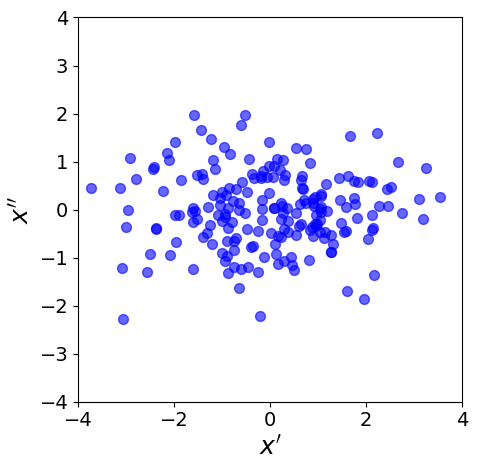

In [35]:
P, W, V = pca_svd(X_3d, n_components=2)

plot_data_2d(P, x_label="$x^\prime$", y_label="$x^{\prime\prime}$", max_lim=4)

**Important:** The computation of the Singular Value Decomposition is a nontrivial numerical task that relies on sophisticated algorithms from numerical linear algebra. Efficient and stable methods for computing the matrices $\mathbf{U}$, $\mathbf{\Sigma}$, and $\mathbf{V}$ have been developed over many decades and are implemented in optimized scientific computing libraries. Since our primary goal is to understand and apply PCA rather than study matrix factorization algorithms, a detailed discussion of how SVD is computed is beyond the scope of this notebook. Instead, we will treat SVD as a powerful tool that allows us to efficiently obtain the principal components of a dataset.

To sum up, the distinction between finding the first principal component and finding the subsequent principal components is, to some extent, artificial. It is primarily introduced for pedagogical reasons because it helps build intuition about the core idea of PCA: the first principal component is the direction that captures the maximum variance in the data, while each subsequent component captures as much of the remaining variance as possible subject to being orthogonal to the previous components. Presenting PCA in this sequential manner makes both the geometric interpretation and the underlying optimization problem easier to understand.

In practice, however, PCA algorithms do not typically compute the principal components one after another. Instead, they determine all principal components simultaneously through matrix decompositions such as the eigendecomposition of the covariance matrix or the singular value decomposition (SVD) of the data matrix. These methods produce the complete set of principal components "in one go", with the sequential interpretation serving mainly as a conceptual framework for understanding why the resulting directions are ordered according to the amount of variance they explain.

###  Deciding on $p$

Although we now know how PCA works, we still need to address the question of how much dimensionality reduction we can "afford". As we discussed early, reducing the dimensionality of any dataset using PCA will result in some loss of information &mdash; apart from the rare case that two features are perfectly correlated (i.e., a Pearson correlation coefficient of $1.0$). And the more we reduce the dimensionality, the more information we lose. In short, we need to find meaningful ways to decide on a good choice for $p$, i.e., the number of dimensions in the projected space after applying PCA.

One practical way to determine $p$ is to evaluate the performance of a downstream task, such as classification or regression, after dimensionality reduction. This approach directly measures how useful the reduced representation is for the intended application. For example, one can train and evaluate a classifier using different numbers of principal components and select the dimensionality that yields the best predictive performance on a validation set. However, this strategy can be computationally expensive and time-consuming, especially when the downstream task itself is complex. Exploring multiple dimensionalities requires repeatedly performing PCA, training models, tuning hyperparameters, and evaluating performance. For large datasets or computationally intensive models, such as deep neural networks, this process can incur substantial resource costs. Thus, we would like some useful insights directly from PCA itself.

Conveniently, the mathematical formulation of PCA provides a natural measure of how much information each principal component captures. PCA is based on the eigendecomposition of the data covariance matrix, where each principal component corresponds to an eigenvector and its associated eigenvalue. The eigenvalue quantifies the variance of the data along that principal component. Consequently, larger eigenvalues indicate directions that capture more of the variability present in the original dataset. This relationship allows the **explained variance** of each principal component to be computed directly from its eigenvalue. Specifically, the proportion of variance explained by a component is given by its eigenvalue divided by the sum of all eigenvalues.

To see this in action, let's once more apply PCA on our $3$-dimensional dataset using the implementation of [scitkit-learn](https://scikit-learn.org/). Notice that we set `n_components=3` to get the principal components together with their eigenvalues for each available dimension.

In [36]:
pca = PCA(n_components=3).fit(X_3d)

The `pca` object has two ways to access the eigenvalues. Firstly, the `explained_variance_` attribute contains the raw eigenvalues of the selected principal components. Each value represents the amount of variance in the original data that is captured by the corresponding principal component. Recall that these values are the largest eigenvalues of the covariance matrix of the mean-centered data.

In [37]:
with np.printoptions(precision=3):
    print(f"Raw eigenvalues: {pca.explained_variance_}")

Raw eigenvalues: [2.177 0.608 0.23 ]


The problem with these raw eigenvalues is that they are, at least in principle, unbounded. This makes it difficult to compare different solutions and to establish consistent thresholds. Thus, in practice, the raw eigenvalues are typically normalized so that they sum up to $1$ (i.e., $100%$). While normalizing the NumPy array containing the raw values is easy to do "by hand", the `pca` object also has the attribute `explained_variance_ratio_` containing the normalized values.

In [38]:
with np.printoptions(precision=3):
    print(f"Normalized eigenvalues: {pca.explained_variance_ratio_}")

Normalized eigenvalues: [0.722 0.201 0.076]


For convenience, we provide the auxiliary method `plot_explained_variance()` to visualize the result. You can set `style="bar"` (preferred for a lower number of principal components) or `style="line"` (preferred for a higher number of principal components). For our demo dataset, we only have $3$ dimensions, so a bar chart works best.

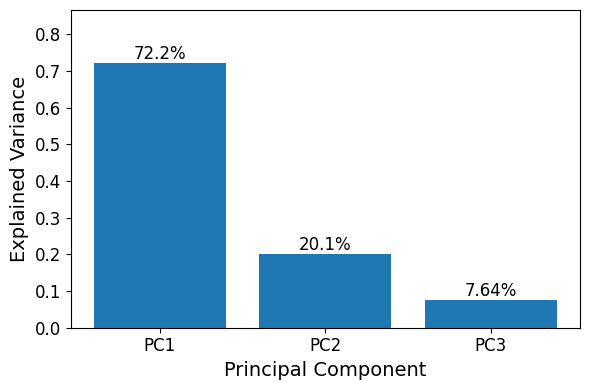

In [39]:
plot_explained_variance(pca.explained_variance_ratio_, style="bar", show_ratios=True)

The interpretation of these number are as follows:

* The 1st principal component (PC1) explains $72.2\%$ of the total variance in our dataset. If we think this is good enough, we could reduce the dataset from $3$ down to $1$ dimension.

* The 2nd principal component (PC2) explains *another* $20.1\%$ often the total variance, meaning that PC1 and PC2 together explain $92.3\%$ of the variance. We already knew that we would preserve more variance when reducing the dataset only to $2$ dimensions (compared to $1$ dimension), but now we can quantify that difference.

* The 3rd principal component (PC3) naturally explains the remaining variance &mdash; ignoring rounding issues &mdash; since our dataset has $3$ dimensions to begin with.

In other words, we are generally interested in the cumulative explained variance to see how many principal components we need to cross a threshold with respect to the overall explained variance. Using the [`np.cumsum()`](https://numpy.org/doc/stable/reference/generated/numpy.cumsum.html) method of NumPy this is very easy to do.

In [40]:
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

with np.printoptions(precision=3):
    print(cumulative_explained_variance)

[0.722 0.924 1.   ]


And, of course, we can visualize the results using a bar or line plot.

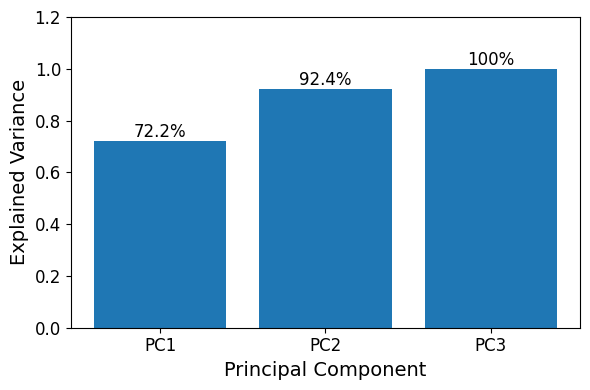

In [41]:
plot_explained_variance(cumulative_explained_variance, style="bar", show_ratios=True)

The remaining question is of course which a good threshold for the cumulative explained variance is. A common rule of thumb is to choose enough principal components to explain $80\%-95\%$ of the total variance in the data. In many practical applications, retaining $90\%$ of the cumulative explained variance is considered a good balance between dimensionality reduction and information preservation. This threshold ensures that most of the original variability in the dataset is retained while significantly reducing the number of dimensions, which can improve computational efficiency and reduce noise.

However, there is no universally optimal threshold. The appropriate value depends on the application and the trade-off between accuracy and model complexity. For example, in data visualization, retaining only $70\%-80\%$ of the variance may be sufficient if the goal is to project data into two or three dimensions. In contrast, for tasks such as scientific analysis or predictive modeling, a higher threshold such as $95\%$ or more may be preferred to avoid losing important information. A common practice is to examine the cumulative explained variance plot and select the number of components at the point where additional components contribute only marginal gains in explained variance.

### Extra: The Missing Math

Recall that we found the 1st principal component by finding the solution of the expression below:

$$
\begin{align}
\large\mathbf{w_1}\ &\large= \underset{\lVert\mathbf{w}\rVert_2 = 1}{\mathrm{argmax}}\ \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}
\end{align}
$$

We said that this expression has the form of the [**Rayleigh quotient**](https://en.wikipedia.org/wiki/Rayleigh_quotient), and that its solution is the eigenvector of $\mathbf{C}$ with the largest eigenvalue. However, instead of simply accepting this definition, it is actually quite straightforward to show that finding the solution for $\mathbf{w}_1$ indeed translates into solving an eigenvector problem. To do this, let's define that part after the $\text{argmax}$ as a function of $\mathbf{w}$:

$$\large
J(\mathbf{w}) = \frac{\mathbf{w}^\top \mathbf{C}\mathbf{w}}{\mathbf{w}^\top\mathbf{w}}
$$

We can now find the value of $\mathbf{w}$ that maximizes $J$ by finding its derivative $\large\frac{dJ(\mathbf{w})}{\mathbf{w}}$, setting it to $0$, and solving for $\mathbf{w}$. For this, remember that $J(\mathbf{w})$ is a function subject to equation constraints (i.e., subject to the condition that one or more equations have to be satisfied exactly by the chosen values of the variables). In our case, the constraint is $\lVert \mathbf{w} \rVert_2 = 1$, which also means that $\mathbf{w}^\top\mathbf{w} = 1$.

Apart from simplifying the expression to $J(\mathbf{w}) = \mathbf{w}^\top \mathbf{C}\mathbf{w}$, we can also add a [**Lagrange multiplier**](https://en.wikipedia.org/wiki/Lagrange_multiplier). A Lagrange multiplier is a mathematical tool used to optimize (maximize or minimize) a function when there is a constraint that must be satisfied. Instead of solving the constrained problem directly, we introduce a new variable, $\lambda$ (the Lagrange multiplier), and combine the objective function and the constraint into a single function called the **Lagrangian** $\mathcal{L}$. Given some multivariate function $f(\mathbf{x})$ (which we want to maximize or minimize) and some function $g(\mathbf{x}) = c$ describing the constraint, the Lagrangian $\mathcal{L}$ is defined as:

$$\large
\mathcal{L}(\mathbf{x},\lambda) = f(\mathbf{x}) - \lambda\left(g(\mathbf{x}) - c  \right)
$$

In our context, function $f$ refers to $J(\mathbf{w})$, function $g$ refers to $\mathbf{w}^\top\mathbf{w}$, and the condition for the constraint is $c = 1$; thus, we get the following Lagrangian for our problem.

$$\large
\mathcal{L}(\mathbf{w},\lambda) = \mathbf{w}^\top \mathbf{C}\mathbf{w} - \lambda\left(\mathbf{w}^\top\mathbf{w} - 1  \right)
$$

To find the critical points (minimum or maximum), we need to take the partial derivative of the Lagrangian $\mathcal{L}$ with respect to the vector $\mathbf{w}$ and set it to $0$. For this, we apply two rules of matrix calculus. Firstly, if $\mathbf{x}$ is a vector and $\mathbf{A}$ is a matrix, then $\large\frac{\mathbf{x}^\top \mathbf{A}\mathbf{x}}{d\mathbf{x}} = \mathbf{x}^\top\left(A + A^\top \right)$. And secondly $\large\frac{\mathbf{x}^\top\mathbf{x}}{d\mathbf{x}} = 2\mathbf{x}$. This gives us the following derivative:

$$\large
\frac{\partial\mathcal{L}}{\partial\mathbf{w}} = \mathbf{w}^\top\left(\mathbf{C} + \mathbf{C}^\top \right) - 2\lambda\mathbf{w}
$$

Recall that the covariance matrix $\mathbf{C}$ is a symmetric matrix, $\mathbf{C} + \mathbf{C}^\top = 2\mathbf{C}$. The resulting term $\mathbf{w}^\top 2\mathbf{C}$ we can the simplify a bit to $2\mathbf{C}\mathbf{w}$, giving us:

$$\large
\frac{\partial\mathcal{L}}{\partial\mathbf{w}} = 2\mathbf{Cw} - 2\lambda\mathbf{w}
$$

Now that we have the derivative, we can set it to $0$ and solve for $\mathbf{w}$. In short, we need to solve:

$$\large
2\mathbf{Cw} - 2\lambda\mathbf{w} = 0
$$

After bringing $2\lambda\mathbf{w}$ to the right-hand side and dividing both sides by $2$, we get:

$$\large
\mathbf{Cw} = \lambda\mathbf{w}
$$

Note that this is exactly the defining equation for an eigenvector and eigenvalue of the matrix $\mathbf{C}$. Thus, any critical point (maximum, minimum, or saddle point) of the Rayleigh quotient must be an eigenvector of $\mathbf{C}$, and the Lagrange multiplier $\lambda$ is its corresponding eigenvalue. The remaining step is to identify the maximum value of $J(\mathbf{w})$. We can do this by substituting our previous result $\mathbf{Cw} = \lambda\mathbf{w}$ back into the Rayleigh quotient expression to see what value it yields at these critical points:

$$\large
J(\mathbf{x}) = \frac{\mathbf{w}^\top \mathbf{C} \mathbf{w}}{\mathbf{w}^\top \mathbf{w}} = \frac{\mathbf{w}^\top (\lambda \mathbf{w})}{\mathbf{w}^\top \mathbf{w}} = \frac{\lambda (\mathbf{w}^\top \mathbf{w})}{\mathbf{w}^\top \mathbf{w}} = \lambda
$$

In other words, the value of the Rayleigh quotient at any eigenvector is exactly its corresponding eigenvalue. Therefore, to maximize $J(\mathbf{w})$, we must choose the eigenvector associated with the largest eigenvalue, $\lambda_{\max}$. With that, we have now formally shown that the vector $\mathbf{w}$ that maximizes the variance of the projected space (i.e., the 1st principal component) is indeed the eigenvector of covariance $\mathbf{C}$ with the largest eigenvalue.

---

## Discussion

PCA is one of the most widely used techniques for exploratory data analysis, data compression, visualization, and feature extraction. Its ability to reduce dimensionality while preserving most of the relevant information makes it a powerful tool for handling high-dimensional datasets efficiently and effectively. In practice, PCA often helps uncover underlying patterns, remove redundancy, reduce noise, and improve the performance of downstream analytical and machine learning methods. However, PCA is not without limitations. For example, it assumes that the most important structure in the data is captured by directions of maximum variance and is fundamentally limited to linear relationships. To address these and other challenges, numerous extensions and variants of PCA have been developed, including methods designed for nonlinear data, robustness to outliers, sparsity, and probabilistic modeling.

### Challenges & Limitations

While PCA is a powerful tool for dimensionality reduction, its efficiency relies heavily on a specific set of mathematical and structural assumptions. When a dataset violates these assumptions, PCA can yield misleading components or fail to capture the true underlying structure of the data. The primary limitations of PCA rooted in its underlying assumptions are:

* **Assumption of linearity:** PCA assumes that the relationships between variables are linear. It constructs principal components as linear combinations of the original features, aiming to find orthogonal axes that maximize variance. If the data lies on a complex, non-linear manifold, PCA will fail to capture the true low-dimensional structure. It will over-estimate the number of dimensions needed to represent the data and fail to unwrap the underlying patterns.

* **Variance equated to information:** PCA identifies the directions of maximum variance and projects the data onto them, operating under the assumption that high variance equals high information, while low variance equals noise. However, variance is not always a proxy for importance, especially in supervised learning contexts. A feature with low variance might be the critical differentiator for a classification task, while a high-variance feature might just be structured noise.

* **Assumption of mean and covariance (Gaussian/ellipsoidal distributions):** PCA relies strictly on the empirical mean and the covariance matrix (i.e.,  first- and second-order statistics), which completely characterize the data *only* if it follows a multivariate normal (Gaussian) distribution. If the data has higher-order dependencies, non-Gaussian distributions, or complex multimodal clusters, PCA will miss these nuances because it implicitly assumes the data forms an ellipsoidal cloud in the feature space.

* **High sensitivity to outliers:** Because PCA relies on minimizing squared distances (maximizing variance, which uses squared deviations from the mean), it is highly susceptible to outliers. A few extreme outliers can heavily skew the sample mean and the covariance matrix. The resulting principal components may align themselves toward the outliers rather than capturing the true variance of the majority of the dataset.

* **Orthogonality of principal components:** PCA forces the resulting principal components to be strictly orthogonal (perpendicular) to each other. While orthogonality is mathematically convenient because it ensures the components are uncorrelated, the real-world underlying processes driving the data might not be orthogonal or independent. Forcing an artificial orthogonal constraint can lead to components that are difficult to interpret biologically, physically, or economically.

* **Lack of interpretability:** Like all feature extraction techniques for dimensionality reduction, PCA transforms the original, meaningful features into a new coordinate system of abstract principal components. Each principal component is a linear combination of *all* original variables. Except in cases where a few features dominate, it is often very difficult to assign a concrete, real-world meaning to a specific component (e.g., what does $0.4\cdot\text{Age} - 0.7\cdot\text{Income} + 0.2\cdot\text{Education}$ physically represent?). This makes PCA a poor choice when model explainability is a strict requirement.

In short, PCA must be applied with care to ensure that the resulting principal components are meaningful and interpretable. If these assumptions are violated, the resulting components may fail to capture the phenomena of interest or may even lead to misleading conclusions. Therefore, it is important to assess whether PCA is appropriate for a given dataset and application. When its assumptions are not satisfied, alternative dimensionality reduction techniques or specialized PCA variants should be considered to obtain more reliable and informative results. While fundamentally different approaches are beyond the scope of this notebook, we briefly outline some popular extensions or variants of PCA below.

### Extensions & Variants

Several important PCA extensions and variants have been proposed to address limitations of classical PCA or adapt it to specific types of data. Here are some of the popular approaches, but keep in mind that this list is not comprehensive.

* **Kernel PCA:** Kernel PCA extends classical PCA to situations where the underlying structure of the data is nonlinear. The key idea is to first transform the data into a higher-dimensional feature space, where complex nonlinear relationships may become approximately linear, and then perform standard PCA in that transformed space. Rather than explicitly computing this potentially very high-dimensional mapping, Kernel PCA uses the so-called *kernel trick*, which allows inner products in the feature space to be computed directly from the original data.


* **Sparse PCA:** In standard PCA, each principal component is typically a linear combination of all input features, making it difficult to understand which variables are driving a particular component. Sparse PCA addresses this issue by introducing sparsity constraints or penalties that force many component loadings to be exactly zero. Intuitively, the method seeks a balance between capturing as much variance as possible and using as few variables as necessary. The resulting components are often easier to interpret because they highlight the most important features while ignoring variables that contribute little to the overall pattern.

* **Robust PCA:** Robust PCA aims to lower the sensitivity to outliers and corrupted observations. It does so by explicitly separating the data into two parts: a low-rank component that captures the underlying structure shared by most observations, and a sparse component that contains unusual observations, outliers, or corruptions. Intuitively, Robust PCA attempts to identify the dominant patterns in the data while isolating and discounting atypical deviations, leading to more reliable and stable principal components when the data are noisy or contaminated.


* **Probabilistic PCA (PPCA):** PPCA reformulates classical PCA as a probabilistic latent-variable model. It assumes that each observation is generated from a small number of unobserved latent variables combined through a linear transformation and corrupted by random noise. Under this model, the principal components correspond to the latent directions that best explain the observed data. Intuitively, PPCA provides a statistical explanation for why dimensionality reduction works: the observed high-dimensional data are assumed to arise from a lower-dimensional structure plus noise.

* **Incremental (Online) PCA:** Incremental (or Online) PCA adapts classical PCA to situations where data arrive continuously or are too large to fit into memory at once. Rather than computing the principal components from the entire dataset in a single batch, the algorithm updates the components incrementally as new observations become available. Intuitively, Incremental PCA maintains and refines its estimate of the dominant directions of variation over time, allowing it to learn from a data stream without repeatedly processing all previously seen data. This substantially reduces memory requirements and computational costs, making PCA practical for large-scale datasets, real-time applications, and continuously evolving data sources.

More generally, these methods can be viewed as modifying one or more key ingredients of classical PCA: the data representation, the optimization objective, the constraints imposed on the components, or the statistical assumptions underlying the model. Despite their differences, they all retain the central goal of PCA: finding a compact low-dimensional representation that captures the most important structure in the data.

---

## Summary

This notebook provided a systematic introduction to **Principal Component Analysis (PCA)**, one of the most widely used techniques for dimensionality reduction and exploratory data analysis. Rather than focusing solely on the application of existing software libraries, the primary goal was to develop a deep understanding of the intuition, mathematics, and algorithmic steps underlying PCA. Starting from the geometric interpretation of variance maximization, we gradually derived the principal components, examined their properties, and explored how PCA transforms high-dimensional data into a more compact and informative representation.

A key theme throughout the notebook was that PCA should not be viewed as a black-box algorithm. To build intuition, we carefully studied the role of variance, covariance, eigenvectors, and eigenvalues, and connected these concepts to the optimization objective that PCA solves. We also emphasized that the common sequential explanation of finding the first, second, and subsequent principal components is primarily a conceptual tool for understanding the method, while practical implementations compute all principal components simultaneously through matrix decomposition techniques such as eigendecomposition or singular value decomposition (SVD).

To reinforce the theoretical concepts, the notebook included multiple implementations of PCA from scratch. By explicitly carrying out the individual computational steps, we gained insight into how PCA is implemented in practice and developed a better appreciation for the assumptions that underlie the method. At the same time, we examined important limitations of classical PCA, including its focus on linear relationships, its sensitivity to feature scaling and outliers, and its reliance on variance as a proxy for information content. We also introduced several important extensions and variants, such as Kernel PCA, Sparse PCA, Robust PCA, Probabilistic PCA, and Incremental PCA, highlighting how these methods address specific shortcomings of the classical approach.

Overall, PCA remains a fundamental and highly practical tool for understanding, visualizing, compressing, and modeling high-dimensional data. Equally important, however, is recognizing when its assumptions are appropriate and when alternative methods should be considered. A solid understanding of PCA provides valuable intuition that extends far beyond this single algorithm and serves as a foundation for many modern dimensionality reduction and representation learning techniques. For this reason, PCA and related dimensionality reduction methods should be part of the core toolbox of every data analyst, AI and machine learning researcher, engineer, and practitioner working with complex data.